## Exercise 6: barostats
1. Implement in simpleMD a Monte Carlo barostat. You can place it at the end of the loop (after the second velocity update), as follows:
- scale cell and positions with an appropriate random factor.
- recompute total energy.
- accept or reject the move.

As a test system you can use the LJ crystal that you have in the examples

2. Compute the average volume for different values of the external pressure.
3. Implement long range corrections (isotropic) in the calculation of the total energy
4. Compute the average volume at a given external pressure for different values of the force cutoff. Try to do the calculation with and without long-range corrections (see point 3) and verify which of the two calculations (with or without long-range corrections) is more sensitive to the value of the force cutoff.
5. Think about the algorithm for the update of the neighbor list. Is it valid also when using the barostat? If not, how should it be changed? (edited)


In [1]:
import numba
import numpy as np
import matplotlib.pyplot as plt
import re

In [79]:
%%bash
cat > in << EOF
inputfile xyz/crystal.xyz
outputfile xyz/output.xyz
temperature 2.0
pressure 5
delta 40.0
tstep 0.005
friction 0.2
forcecutoff 2.5
listcutoff 3.0
longrange True
nstep 2000
nconfig 10 xyz/trajectory.xyz
nstat 1 xyz/energies.dat
EOF
python3 python/simplemd2.py < in

Neighbour list recomputed at step  0
List size:  256000
-0.00572226448594134
energy post -1794.5193152497761
-0.011665119818943557
energy post -1536.9116561524609
-0.01744604869604741
energy post -1916.870164205065
Neighbour list recomputed at step  3
List size:  256000
-0.022590209099932146
energy post -1827.6038733393066
-0.0275000001508271
energy post -1838.1701082499233
-0.0318216952971828
energy post -1825.8324593256632
-0.03539526142055332
energy post -1759.8692686897316
-0.03858582361440878
energy post -1689.4870472050297
-0.041228068056407406
energy post -1628.136986376725
-0.04326365438114181
energy post -1533.9979060250923
-0.04443723528401047
energy post -1094.156338576639
-0.044736132730508874
energy post -917.9774246859238
-0.04403408491995476
energy post -1088.7579540229667
-0.04245917273555413
energy post -1458.8345279299012
-0.04023374609534601
energy post -1533.8135822514137
-0.03658787213395633
energy post -1515.4679110791274
-0.03252139886548165
energy post -1537.974

In [74]:
energy=np.loadtxt('xyz/energies.dat').T

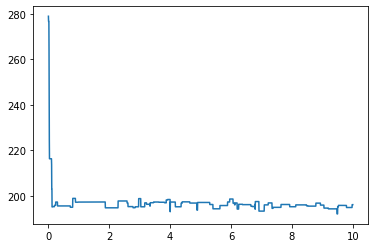

In [75]:
volume=energy[6]
plt.plot(energy[1],volume)
#plt.yscale('log')

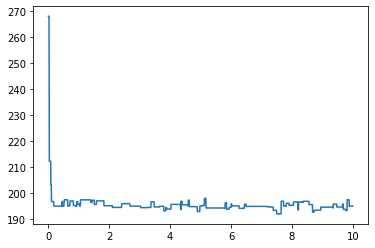

In [57]:
volume=energy[6]
plt.plot(energy[1],volume)
#plt.yscale('log')

In [6]:
print(volume[0])
print(np.mean(volume))
print(np.std(volume)) # std on the single measure, not on the average
print(6.7184**3)

270.897049
195.36569807385
1.4031114623416636
303.247739285504


In [7]:
%%bash
for pressure in 0.1 0.2 0.5 1 2 5 10 20 50 100 200 500
do
cat > in-$pressure << EOF
inputfile xyz/crystal.xyz
outputfile xyz/output.xyz
delta 40
pressure $pressure
temperature 2.0
tstep 0.005
friction 0.2
forcecutoff 2.5
listcutoff 3.0
nstep 4000
nconfig 10 trajectoryF$pressure.xyz
nstat 10 energiesF$pressure.dat
EOF
python3 python/simplemd1.py < in-$pressure
done

Neighbour list recomputed at step  0
List size:  256000
-0.00572226448594134
energy post -1415.9732050249943
-0.011724906623588278
energy post -1607.8658978767667
-0.01752019252623747
energy post -1524.5054083249163
-0.023228882101916273
energy post -1684.1787344851673
-0.027893198190408537
energy post -1605.104593443101
-0.032485160390213964
energy post -1697.922438565532
Neighbour list recomputed at step  6
List size:  256000
-0.03505993731279661
energy post -1442.3613405512667
-0.038941189646996326
energy post -957.5850967238587
-0.04132979846930152
energy post -1390.8787103364077
-0.04323857287302749
energy post -1399.5182908310976
-0.04460312952813709
energy post -1238.4703847681187
-0.04466448188839701
energy post -1340.9147927156719
-0.043936458093267766
energy post -1401.1719682667551
Neighbour list recomputed at step  13
List size:  256000
-0.043315314546149765
energy post -1385.1147693523699
-0.04125089173754933
energy post -1415.6392468497688
-0.03911456636921938
energy post

/home/ivang/Documenti/exercise6/GiovanniBussi-simplemd-9f7f5d7/python/simplemd1.py:318: RuntimeWarning: overflow encountered in exp
  alpha=((new_volume/volume)**natoms)*np.exp(-1/self.temperature*(new_engconf-engconf+self.pressure*(new_volume-volume)))
/home/ivang/Documenti/exercise6/GiovanniBussi-simplemd-9f7f5d7/python/simplemd1.py:318: RuntimeWarning: overflow encountered in exp
  alpha=((new_volume/volume)**natoms)*np.exp(-1/self.temperature*(new_engconf-engconf+self.pressure*(new_volume-volume)))
/home/ivang/Documenti/exercise6/GiovanniBussi-simplemd-9f7f5d7/python/simplemd1.py:318: RuntimeWarning: overflow encountered in exp
  alpha=((new_volume/volume)**natoms)*np.exp(-1/self.temperature*(new_engconf-engconf+self.pressure*(new_volume-volume)))
/home/ivang/Documenti/exercise6/GiovanniBussi-simplemd-9f7f5d7/python/simplemd1.py:318: RuntimeWarning: overflow encountered in exp
  alpha=((new_volume/volume)**natoms)*np.exp(-1/self.temperature*(new_engconf-engconf+self.pressure*(new_v

In [8]:
# volume: 6th column in energiesF$pressure
ene={} # a dictionary
#pressure=[0.01,0.1,1,2]#,5,10,20,30,40,50,60,70,80,90,100]#,200,500,1000]#,-1,-5,-10]
pressure=[0.1,0.2,0.5,1,2,5,10,20,50,100,200,500]#,0.8,1,1.2,1.4,1.7,2]#,5,10,20,50,100,200,500]
#pressure=[20,50,100,200,500]
#pressure=[50]
#pressure=[-1,-10]
for p in pressure:
    ene[p]=np.loadtxt("energiesF" + str(p) + ".dat")

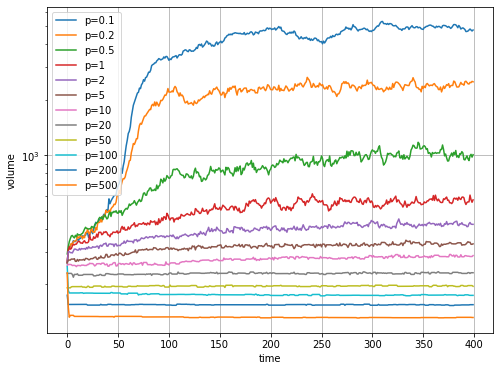

In [10]:
plt.figure(figsize=(8,6))
for p in pressure:
    plt.plot(ene[p][:,6],label='p=%s'%p)
plt.legend()
plt.grid(axis='both')
plt.xlabel('time')
plt.ylabel('volume')
plt.yscale('log')
plt.show()

In [ ]:
av_vol=np.zeros(len(pressure))
std_vol=np.zeros(len(pressure))
for i in range(len(pressure)):
    av_vol[i]=np.mean(ene[pressure[i]][:,6])
    std_vol[i]=np.std(ene[pressure[i]][:,6])

In [ ]:
plt.figure()
plt.plot(pressure,av_vol,'*')
plt.xlabel('pressure')
plt.ylabel('av. volume')
plt.grid(axis='both')
#plt.xscale('log')
#plt.yscale('log')
print(av_vol)

plt.figure()
plt.plot(pressure,std_vol,'*')
plt.xlabel('pressure')
plt.ylabel('std. volume')
plt.grid(axis='both')
print(std_vol)
# maybe set delta prop. to the (initial) volume

In [69]:
%%bash
for temperature in 2 5 10 12 14 16 18 20
do
cat > in-$temperature << EOF
inputfile xyz/crystal.xyz
outputfile xyz/output.xyz
delta 40
pressure 1
temperature $temperature
tstep 0.005
friction 1
forcecutoff 2.5
listcutoff 3.0
longrange True
nstep 4000
nconfig 10 trajectoryF$temperature.xyz
nstat 10 energiesF$temperature.dat
EOF
python3 python/simplemd2.py < in-$temperature
done

Neighbour list recomputed at step  0
List size:  256000
-0.005473270451136058
energy post -1798.5968624787922
-0.011467832033444892
energy post -1565.277168252891
-0.017119031330214966
energy post -1767.68409534625
-0.02260848825686354
energy post -1895.9106477560915
Neighbour list recomputed at step  4
List size:  256000
-0.025595060526669
energy post -1840.7289354961667
-0.02868419564855176
energy post -1760.9084450975233
Neighbour list recomputed at step  6
List size:  256000
-0.031526149266802535
energy post -1675.145694437472
-0.03452410206241781
energy post -1650.317335445397
-0.03583827662315061
energy post -1594.306626118384
-0.03768402711536848
energy post -1484.1735017104072
-0.03902379989762942
energy post -1465.830221832083
Neighbour list recomputed at step  11
List size:  256000
-0.041665165479691395
energy post -1399.0286833975251
-0.04265906253029018
energy post -1428.3877948282502
-0.04351411510037399
energy post -1347.0008507166265
-0.04455091817190728
energy post -139

In [70]:
# volume: 6th column in energiesF$pressure
ene={} # a dictionary

temperature=[2,5,10,12,14,16,18,20]#,20,50,100,200,500]#,0.8,1,1.2,1.4,1.7,2]#,5,10,20,50,100,200,500]
for T in temperature:
    ene[T]=np.loadtxt("energiesF" + str(T) + ".dat")

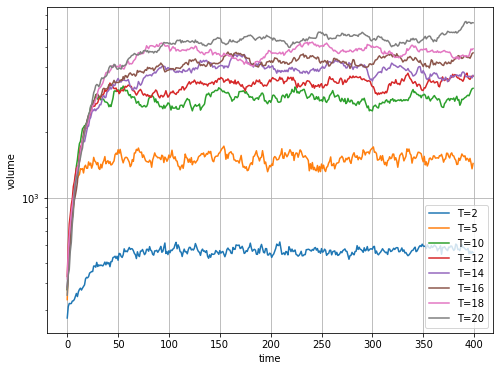

In [71]:
plt.figure(figsize=(8,6))
for T in temperature:
    plt.plot(ene[T][:,6],label='T=%s'%T)
plt.legend()
plt.grid(axis='both')
plt.xlabel('time')
plt.ylabel('volume')
plt.yscale('log')
plt.show()

In [14]:
av_vol=np.zeros(len(pressure))
std_vol=np.zeros(len(pressure))
for i in range(len(pressure)):
    av_vol[i]=np.mean(ene[pressure[i]][:,6])
    std_vol[i]=np.std(ene[pressure[i]][:,6])

KeyError: 0.1

[4184.04890373 2003.44792419  806.1316428   525.61534697  395.4943398
  315.51286141  275.36780115  226.73301703  195.58794601  176.70454051
  154.58026869  132.51909138]
[1.40190602e+03 6.63280306e+02 2.12850112e+02 8.46891511e+01
 4.00090049e+01 1.44572956e+01 8.86720922e+00 3.10175000e+00
 1.81203894e+00 5.58447849e+00 6.34561684e-01 4.40869652e+00]


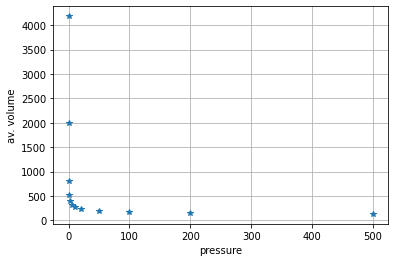

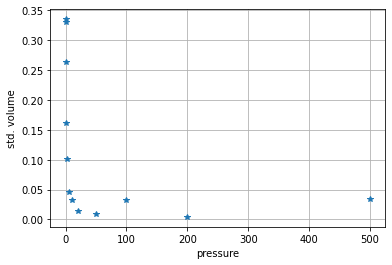

In [230]:
plt.figure()
plt.plot(pressure,av_vol,'*')
plt.xlabel('pressure')
plt.ylabel('av. volume')
plt.grid(axis='both')
#plt.xscale('log')
#plt.yscale('log')
print(av_vol)

plt.figure()
plt.plot(pressure,std_vol,'*')
plt.xlabel('pressure')
plt.ylabel('std. volume')
plt.grid(axis='both')
print(std_vol)
# maybe set delta prop. to the (initial) volume

In [104]:
%%bash
for forcecutoff in 1.0 2.0 2.5 3.0
do
cat > in-$forcecutoff << EOF
inputfile xyz/crystal.xyz
outputfile xyz/output.xyz
delta 40
pressure 1.5
temperature 2
tstep 0.005
friction 0.2
longrange True
forcecutoff $forcecutoff
listcutoff 3.0
nstep 4000
nconfig 10 trajectoryF$forcecutoff.xyz
nstat 10 energiesFlr$forcecutoff.dat
EOF
python3 python/simplemd2.py < in-$forcecutoff
done

Neighbour list recomputed at step  0
List size:  256000
-0.00572226448594134
energy post -1847.3014213594136
-0.011706620961893528
energy post -1663.8325212236502
-0.01756525292827458
energy post -2094.773780813214
-0.02268631325945483
energy post -2388.457086982528
-0.02702805389299718
energy post -2415.4906575374293
-0.031166049154326393
energy post -2287.732415788783
-0.0344303123511399
energy post -1678.3359440571537
-0.03693449340334242
energy post -1576.0745041311595
-0.037271665531649345
energy post -875.943621341823
Neighbour list recomputed at step  9
List size:  256000
-0.03651075492650065
energy post -2111.420928625061
-0.03617962138541814
energy post -2063.812212379292
-0.03401457061106143
energy post -1924.1094636265234
-0.0314379946377186
energy post -1993.1833370491652
-0.028654532828296202
energy post -2138.5909636297056
-0.025685543675687896
energy post -2060.9969810727516
-0.022459391702958097
energy post -2035.5791220770145
-0.019334425819449143
energy post -2078.692

In [97]:
%%bash
for forcecutoff in 1.0 2.0 2.5 3.0
do
cat > in-$forcecutoff << EOF
inputfile xyz/crystal.xyz
outputfile xyz/output.xyz
delta 40
pressure 1.5
temperature 2
tstep 0.005
longrange False
friction 0.2
forcecutoff $forcecutoff
listcutoff 3.0
nstep 4000
nconfig 10 trajectoryF$forcecutoff.xyz
nstat 10 energiesF$forcecutoff.dat
EOF
python3 python/simplemd2.py < in-$forcecutoff
done

Neighbour list recomputed at step  0
List size:  256000
-0.00572226448594134
energy post -1752.9632479311638
-0.011744864623744154
energy post -1996.8375373739216
-0.017226196432910172
energy post -2008.5436450750487
-0.023034614745241547
energy post -2032.8178184947183
-0.028281127035502812
energy post -2073.035384650813
-0.0331406156746524
energy post -1882.5713679259165
-0.03802833138668957
energy post -2173.390162641653
-0.04165124898329981
energy post -2030.7738702217864
-0.045350742274871875
energy post -1740.213387137708
-0.048130821951404903
energy post -1693.5544308906951
-0.04935447696775173
energy post -477.57212838654414
-0.048978490178611084
energy post -1933.8242803320638
-0.04804441069275333
energy post -1622.6972101504703
-0.04523316676257038
energy post -1966.220124607322
-0.041516793945096414
energy post -1967.3405543120866
-0.036939832660053004
energy post -1945.4309610399807
-0.03198727466513907
energy post -1931.8431627924342
-0.026491252434365474
energy post -1885

In [105]:
# volume: 6th column in energiesF$pressure
enelr={} # a dictionary
forcecutoff=[1.0,2.0,2.5,3.0]#5.0,10.0,20.0,50.0,100.0]
for p in forcecutoff:
    enelr[p]=np.loadtxt("energiesFlr" + str(p) + ".dat")

ene={} # a dictionary
for p in forcecutoff:
    ene[p]=np.loadtxt("energiesF" + str(p) + ".dat")

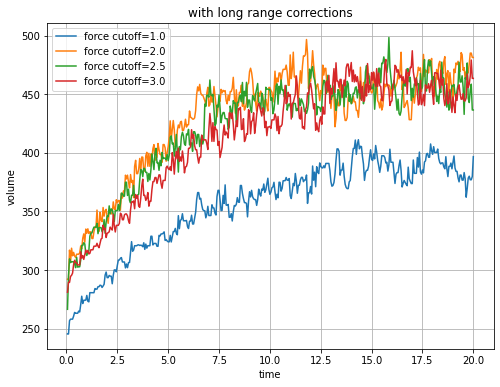

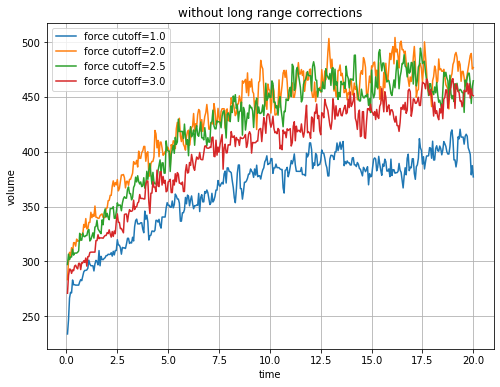

In [106]:
plt.figure(figsize=(8,6))
for p in forcecutoff:
    plt.plot(enelr[p][:,1],enelr[p][:,6],label='force cutoff=%s'%p)
plt.legend()
plt.grid(axis='both')
plt.xlabel('time')
plt.ylabel('volume')
plt.title('with long range corrections')
plt.show()

plt.figure(figsize=(8,6))
for p in forcecutoff:
    plt.plot(ene[p][:,1],ene[p][:,6],label='force cutoff=%s'%p)
plt.legend()
plt.grid(axis='both')
plt.xlabel('time')
plt.ylabel('volume')
plt.title('without long range corrections')
plt.legend()
plt.show()